# G2M insight for Cab Investment firm

# Solution

## Import Libraries

In [2]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
import glob 
import plotly.express as px
from scipy import stats

## Load the dataset

In [3]:
dataset_dir = r'./datasets'

In [4]:
csv = glob.glob(dataset_dir +'/*.csv')
print('Total count of dataset:', len(csv))

Total count of dataset: 4


In [5]:
print(csv)

['./datasets\\Cab_Data.csv', './datasets\\City.csv', './datasets\\Customer_ID.csv', './datasets\\Transaction_ID.csv']


In [6]:
cab_data = pd.read_csv(csv[0])
city_data = pd.read_csv(csv[1])
customer_data = pd.read_csv(csv[2])
transaction_data = pd.read_csv(csv[3])

## Descriptive Analysis of the Data

**Cab Dataset**

In [7]:
cab_data.head()

,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip
0,10000011,42377,Pink Cab,ATLANTA GA,30.45,370.95,313.635
1,10000012,42375,Pink Cab,ATLANTA GA,28.62,358.52,334.854
2,10000013,42371,Pink Cab,ATLANTA GA,9.04,125.20,97.632
3,10000014,42376,Pink Cab,ATLANTA GA,33.17,377.40,351.602
4,10000015,42372,Pink Cab,ATLANTA GA,8.73,114.62,97.776


In [8]:
cab_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359392 entries, 0 to 359391
Data columns (total 7 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Transaction ID  359392 non-null  int64  
 1   Date of Travel  359392 non-null  int64  
 2   Company         359392 non-null  object 
 3   City            359392 non-null  object 
 4   KM Travelled    359392 non-null  float64
 5   Price Charged   359392 non-null  float64
 6   Cost of Trip    359392 non-null  float64
dtypes: float64(3), int64(2), object(2)
memory usage: 19.2+ MB


In [9]:
cab_data.shape

(359392, 7)

In [10]:
cab_data.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Transaction ID,359392.0,NaN,NaN,NaN,10220761.185363,126805.803715,10000011.0,10110809.75,10221035.5,10330937.25,10440107.0
Date of Travel,359392.0,NaN,NaN,NaN,42964.067998,307.467197,42371.0,42697.0,42988.0,43232.0,43465.0
Company,359392,2,Yellow Cab,274681,NaN,NaN,NaN,NaN,NaN,NaN,NaN
City,359392,19,NEW YORK NY,99885,NaN,NaN,NaN,NaN,NaN,NaN,NaN
KM Travelled,359392.0,NaN,NaN,NaN,22.567254,12.233526,1.9,12.0,22.44,32.96,48.0
Price Charged,359392.0,NaN,NaN,NaN,423.443311,274.378911,15.6,206.4375,386.36,583.66,2048.03
Cost of Trip,359392.0,NaN,NaN,NaN,286.190113,157.993661,19.0,151.2,282.48,413.6832,691.2


**City data**

In [11]:
city_data.head()

,City,Population,Users
0,NEW YORK NY,"8,405,837","302,149"
1,CHICAGO IL,"1,955,130","164,468"
2,LOS ANGELES CA,"1,595,037","144,132"
3,MIAMI FL,"1,339,155","17,675"
4,SILICON VALLEY,"1,177,609","27,247"


In [12]:
city_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20 entries, 0 to 19
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   City        20 non-null     object
 1   Population  20 non-null     object
 2   Users       20 non-null     object
dtypes: object(3)
memory usage: 608.0+ bytes


In [13]:
city_data.shape

(20, 3)

In [14]:
city_data.describe(include='all').T

,count,unique,top,freq
City,20,20,NEW YORK NY,1
Population,20,20,"8,405,837",1
Users,20,20,"302,149",1


In [15]:
city_data['Population'] = city_data['Population'].str.replace(',','')
city_data['Users'] = city_data['Users'].str.replace(',','')

In [16]:
city_data['Population'] = city_data['Population'].astype('int64')
city_data['Users'] = city_data['Users'].astype('int64')

In [17]:
city_data.dtypes

City          object
Population     int64
Users          int64
dtype: object

**Customer ID data**

In [18]:
customer_data.head()

,Customer ID,Gender,Age,Income (USD/Month)
0,29290,Male,28,10813
1,27703,Male,27,9237
2,28712,Male,53,11242
3,28020,Male,23,23327
4,27182,Male,33,8536


In [19]:
customer_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49171 entries, 0 to 49170
Data columns (total 4 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Customer ID         49171 non-null  int64 
 1   Gender              49171 non-null  object
 2   Age                 49171 non-null  int64 
 3   Income (USD/Month)  49171 non-null  int64 
dtypes: int64(3), object(1)
memory usage: 1.5+ MB


In [20]:
customer_data.shape

(49171, 4)

In [21]:
customer_data.describe(include='all')

,Customer ID,Gender,Age,Income (USD/Month)
count,49171.000000,49171,49171.000000,49171.000000
unique,NaN,2,NaN,NaN
top,NaN,Male,NaN,NaN
freq,NaN,26562,NaN,NaN
mean,28398.252283,NaN,35.363121,15015.631856
std,17714.137333,NaN,12.599066,8002.208253
min,1.000000,NaN,18.000000,2000.000000
25%,12654.500000,NaN,25.000000,8289.500000
50%,27631.000000,NaN,33.000000,14656.000000
75%,43284.500000,NaN,42.000000,21035.000000


**Transactions data**

In [22]:
transaction_data.head()

,Transaction ID,Customer ID,Payment_Mode
0,10000011,29290,Card
1,10000012,27703,Card
2,10000013,28712,Cash
3,10000014,28020,Cash
4,10000015,27182,Card


In [23]:
transaction_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 440098 entries, 0 to 440097
Data columns (total 3 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   Transaction ID  440098 non-null  int64 
 1   Customer ID     440098 non-null  int64 
 2   Payment_Mode    440098 non-null  object
dtypes: int64(2), object(1)
memory usage: 10.1+ MB


In [24]:
transaction_data.shape

(440098, 3)

In [25]:
transaction_data.describe(include='all')

,Transaction ID,Customer ID,Payment_Mode
count,4.400980e+05,440098.000000,440098
unique,NaN,NaN,2
top,NaN,NaN,Card
freq,NaN,NaN,263991
mean,1.022006e+07,23619.513120,NaN
std,1.270455e+05,21195.549816,NaN
min,1.000001e+07,1.000000,NaN
25%,1.011004e+07,3530.000000,NaN
50%,1.022006e+07,15168.000000,NaN
75%,1.033008e+07,43884.000000,NaN


## Merge into single Dataframe

In [26]:
df = cab_data.merge(transaction_data, on= 'Transaction ID').merge(
    customer_data, on ='Customer ID').merge(city_data, on = 'City')

In [27]:
df.head()

,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip,Customer ID,Payment_Mode,Gender,Age,Income (USD/Month),Population,Users
0,10000011,42377,Pink Cab,ATLANTA GA,30.45,370.95,313.6350,29290,Card,Male,28,10813,814885,24701
1,10351127,43302,Yellow Cab,ATLANTA GA,26.19,598.70,317.4228,29290,Cash,Male,28,10813,814885,24701
2,10412921,43427,Yellow Cab,ATLANTA GA,42.55,792.05,597.4020,29290,Card,Male,28,10813,814885,24701
3,10000012,42375,Pink Cab,ATLANTA GA,28.62,358.52,334.8540,27703,Card,Male,27,9237,814885,24701
4,10320494,43211,Yellow Cab,ATLANTA GA,36.38,721.10,467.1192,27703,Card,Male,27,9237,814885,24701


In [28]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 359392 entries, 0 to 359391
Data columns (total 14 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   Transaction ID      359392 non-null  int64  
 1   Date of Travel      359392 non-null  int64  
 2   Company             359392 non-null  object 
 3   City                359392 non-null  object 
 4   KM Travelled        359392 non-null  float64
 5   Price Charged       359392 non-null  float64
 6   Cost of Trip        359392 non-null  float64
 7   Customer ID         359392 non-null  int64  
 8   Payment_Mode        359392 non-null  object 
 9   Gender              359392 non-null  object 
 10  Age                 359392 non-null  int64  
 11  Income (USD/Month)  359392 non-null  int64  
 12  Population          359392 non-null  int64  
 13  Users               359392 non-null  int64  
dtypes: float64(3), int64(7), object(4)
memory usage: 41.1+ MB


In [29]:
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Transaction ID,359392.0,NaN,NaN,NaN,10220761.185363,126805.803715,10000011.0,10110809.75,10221035.5,10330937.25,10440107.0
Date of Travel,359392.0,NaN,NaN,NaN,42964.067998,307.467197,42371.0,42697.0,42988.0,43232.0,43465.0
Company,359392,2,Yellow Cab,274681,NaN,NaN,NaN,NaN,NaN,NaN,NaN
City,359392,19,NEW YORK NY,99885,NaN,NaN,NaN,NaN,NaN,NaN,NaN
KM Travelled,359392.0,NaN,NaN,NaN,22.567254,12.233526,1.9,12.0,22.44,32.96,48.0
Price Charged,359392.0,NaN,NaN,NaN,423.443311,274.378911,15.6,206.4375,386.36,583.66,2048.03
Cost of Trip,359392.0,NaN,NaN,NaN,286.190113,157.993661,19.0,151.2,282.48,413.6832,691.2
Customer ID,359392.0,NaN,NaN,NaN,19191.652115,21012.412463,1.0,2705.0,7459.0,36078.0,60000.0
Payment_Mode,359392,2,Card,215504,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Gender,359392,2,Male,205912,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Exploratory Data Analysis

### Relationship of all variables

In [45]:
plt.rcParams['figure.figsize']=(15,10)

**Pairplot**

Text(0.5, 1.0, 'Pairplot of the Dataset')

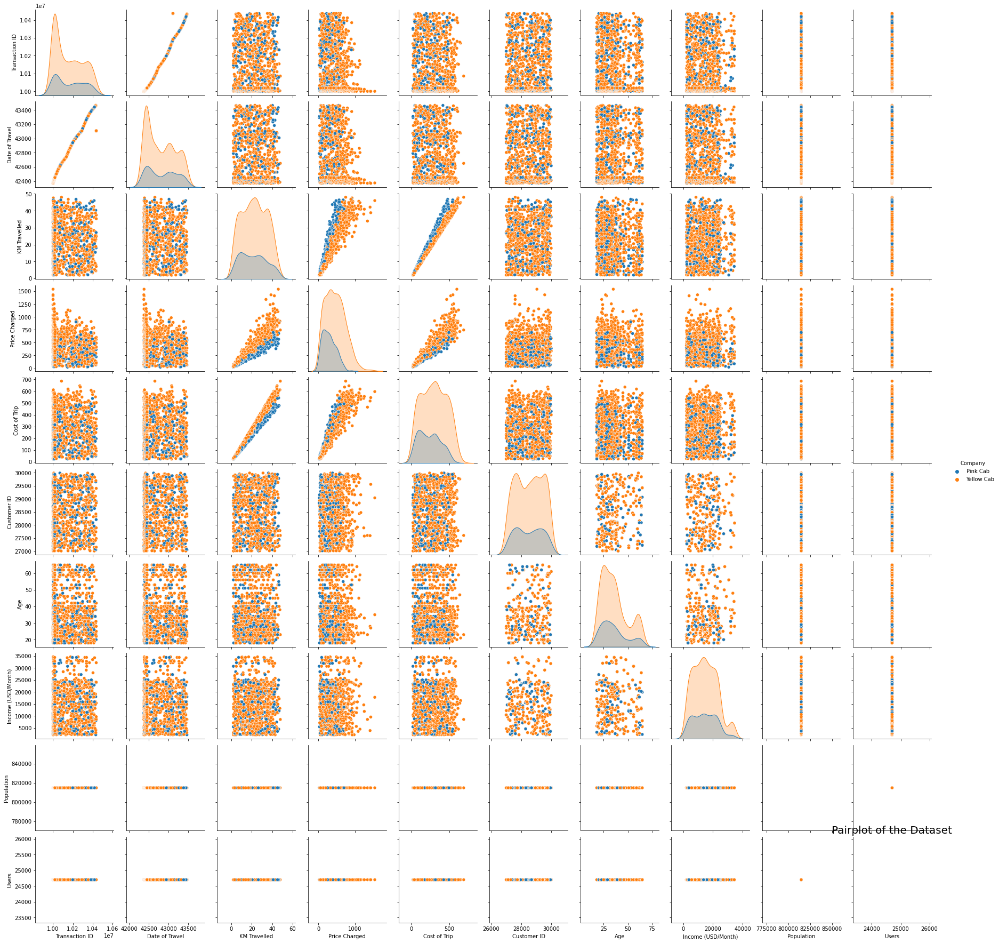

In [48]:
sns.pairplot(df.head(1000),hue='Company')
plt.title('Pairplot of the Dataset', fontsize=20)

**Correlation Heatmap**

Text(0.5, 1.0, 'Correlation Heatmap of the Dataset')

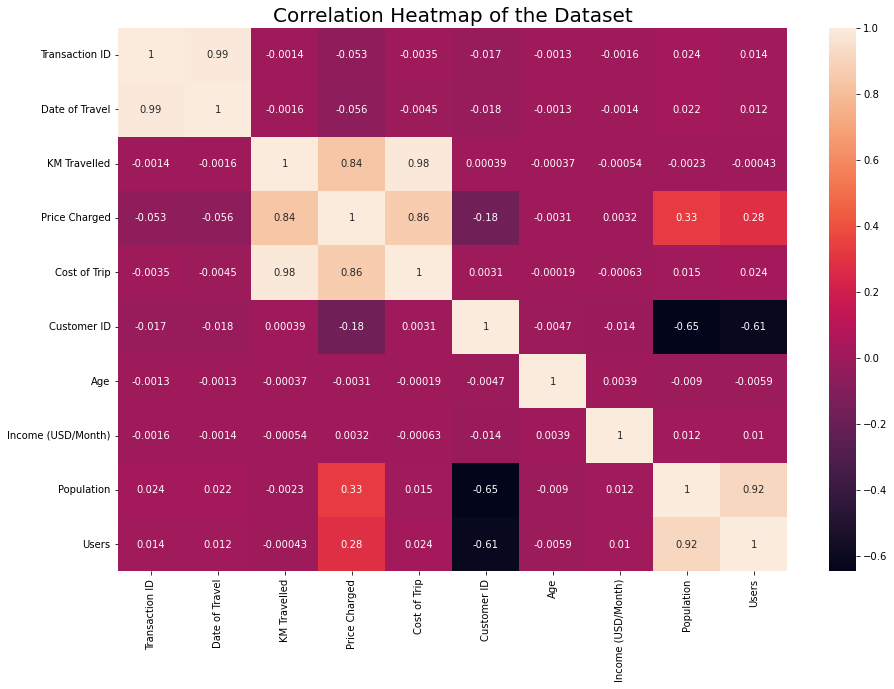

In [47]:
sns.heatmap(df.corr(),annot=True)
plt.title('Correlation Heatmap of the Dataset', fontsize=20)

> 1. There is a strong positive correlation between population and users. It seems that as the Population of a certain area increases, the number of users of the cab company also increases. <br>
> 2. Cost of Trip and KM Travelled has strong positive correlation with one another. This indicates that as the distance of the trip travelled by the cab increases, the cost of the trip will also increase.
> 3. Cost of Trip and Price Charged has strong positive correlation with one another. As the cost of trip increases, the price charged also increases. Although it seems that the cost of trip and price charged have high covariance with one another.

### Users

**Users per company**

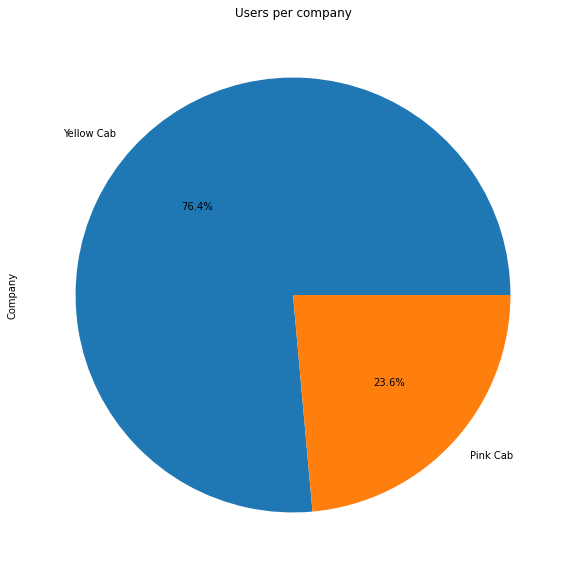

In [33]:
# Target Variable
df['Company'].value_counts().plot(kind='pie',autopct='%1.1f%%')
plt.title('Users per company')
plt.show()

> Yellow cab company has the most users.

**Gender of users**

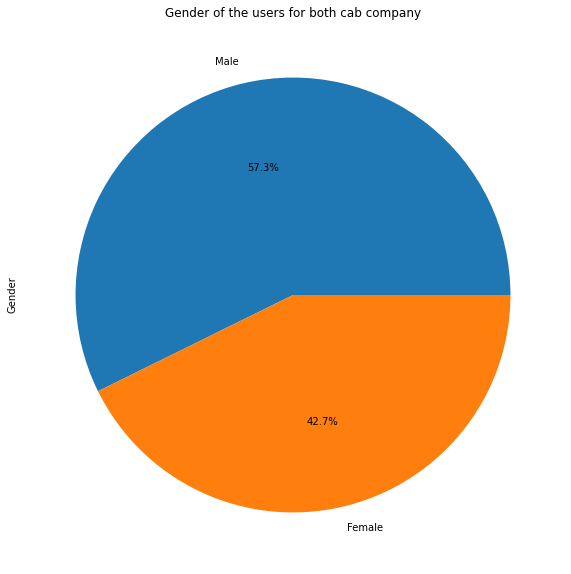

In [34]:
# Target Variable
df['Gender'].value_counts().plot(kind='pie',autopct='%1.1f%%')
plt.title('Gender of the users for both cab company')
plt.show()

> Based on the results, 57.3% of the users of both company are male.

In [49]:
fig = px.histogram(df, x="Company", color="Gender", text_auto=True, title="Gender of Users per Company")
fig.show()

> Most of the gender of users for both the cab companies are male. 

> 

**Location of users per company**

In [36]:
cities = df[df['Company']=='Yellow Cab'].groupby('City')['Transaction ID'].count().index
count = df[df['Company']=='Yellow Cab'].groupby('City')['Transaction ID'].count().values
df_yellow_cities = pd.DataFrame(zip(cities,count), columns=['Cities','Count'])
df_yellow_cities = df_yellow_cities.sort_values(by='Count', ascending='False')

In [37]:
fig = px.bar(df_yellow_cities, y='Count', x='Cities', text_auto='.2s',
            title="Location of users for Yellow Cab Company")
fig.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False)
fig.show()

> Most of the users for Yellow Cab Company are located at New York City, Chicago, Washington, Los Angeles, Boston and San Diego.

In [38]:
cities = df[df['Company']=='Pink Cab'].groupby('City')['Transaction ID'].count().index
count = df[df['Company']=='Pink Cab'].groupby('City')['Transaction ID'].count().values
df_pink_cities = pd.DataFrame(zip(cities,count), columns=['Cities','Count'])
df_pink_cities = df_pink_cities.sort_values(by='Count', ascending='False')

In [39]:
fig = px.bar(df_pink_cities, y='Count', x='Cities', text_auto='.2s',
            title="Location of users for Pink Cab Company")
fig.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False, marker_color='lightsalmon')
fig.show()

> Most of the users for Pink Cab Company are located at Los Angeles, New York City, San Diego, Chicago and Boston.

**Users income**

C:\Users\Rocelle Nathalie Ong\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



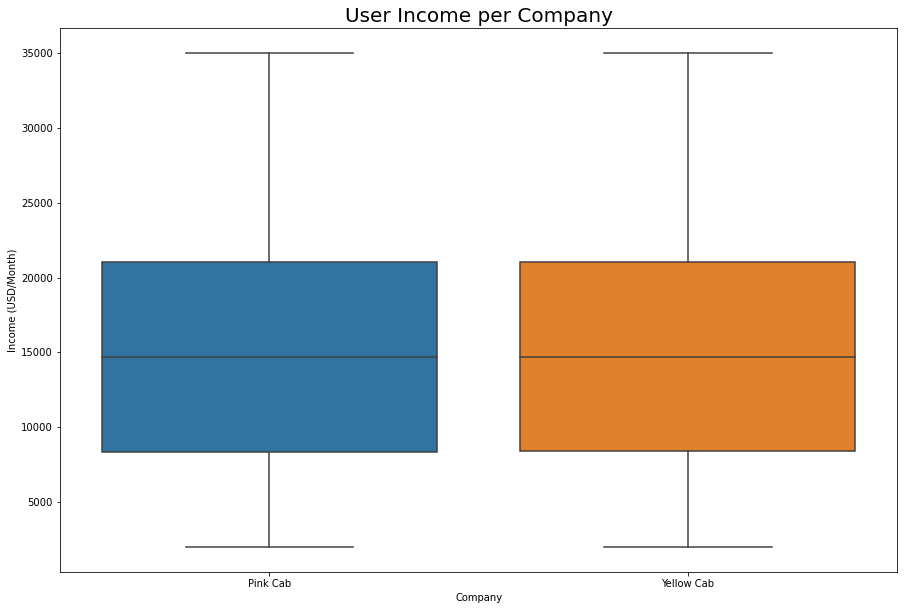

In [40]:
sns.boxplot(df['Company'], df['Income (USD/Month)'])
plt.title('User Income per Company', fontsize=20)
plt.show()

> The average income of the users for both cab company is around 15000 USD/month.

**Age of users**

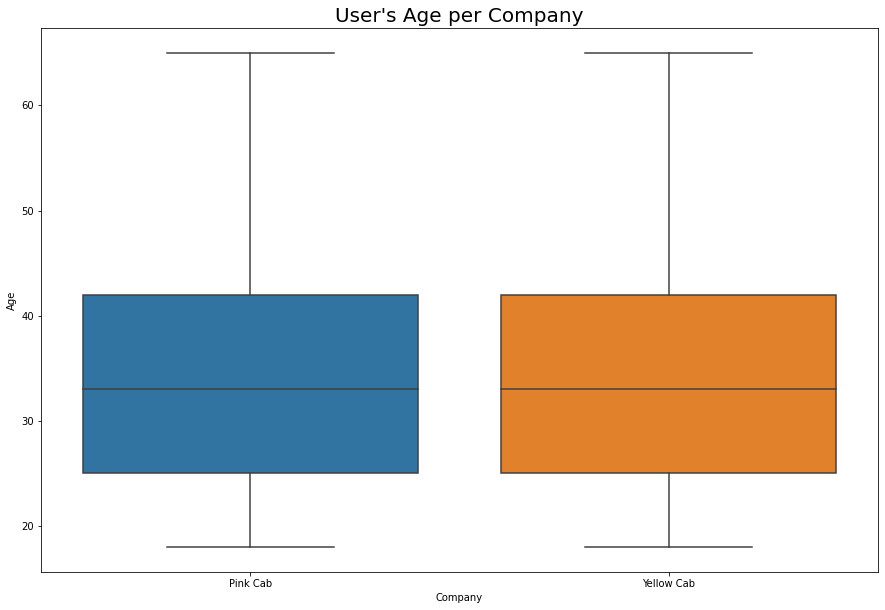

In [42]:
sns.boxplot(data=df, x='Company',y='Age')
plt.title("User's Age per Company", fontsize=20)
plt.show()

> The average age of the users of the company cab is 35 years old

### Distance

**Distance travelled per company**

Text(0.5, 1.0, 'Distance in KM Travelled by Yellow Cab Company')

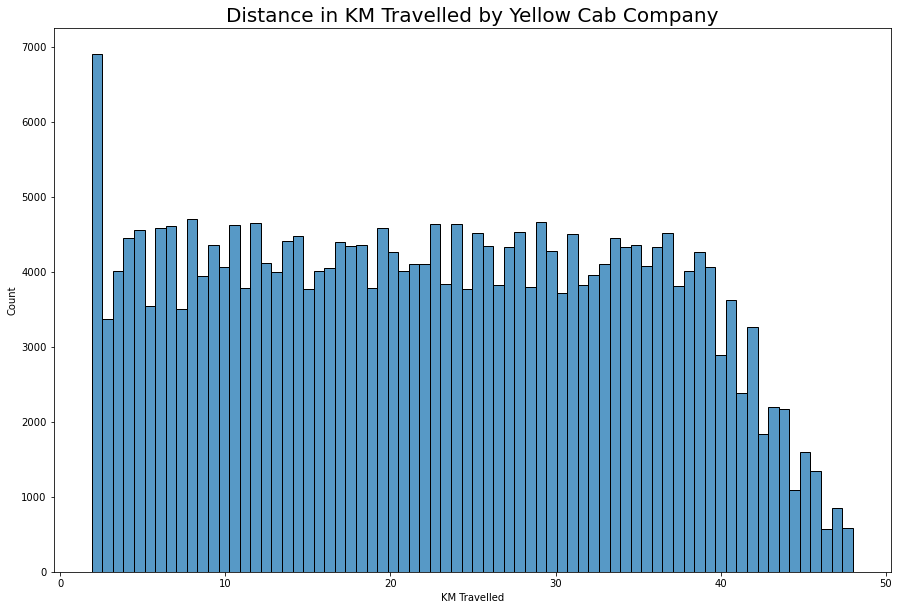

In [44]:
yellow_df = df[df['Company']=='Yellow Cab']
sns.histplot(yellow_df['KM Travelled'])
plt.title('Distance in KM Travelled by Yellow Cab Company', fontsize=20)

> The KM Travelled by yellow cab company ranges from 2 to 48 KM. It can also be seen that 2km is most frequent distance travelled. We can assume that most of the people will travel in short distance relies on yellow cab.

Text(0.5, 1.0, 'Distance in KM Travelled by Pink Cab Company')

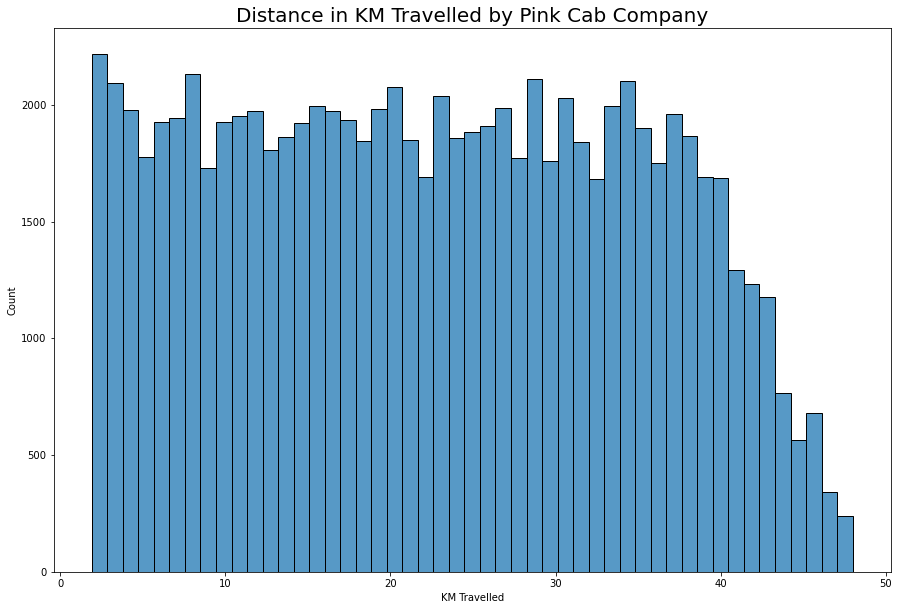

In [43]:
pink_df = df[df['Company']=='Pink Cab']
sns.histplot(pink_df['KM Travelled'])
plt.title('Distance in KM Travelled by Pink Cab Company', fontsize=20)

> The KM Travelled by pink cab company ranges from 2 to 48 KM. Most of the frequent distance travel are 2km to 40km. It can be seen that people who travels in long distance prefers on using Pink Cab.

### Payment

**Most common mode of payment per company**

<AxesSubplot:xlabel='Payment_Mode', ylabel='count'>

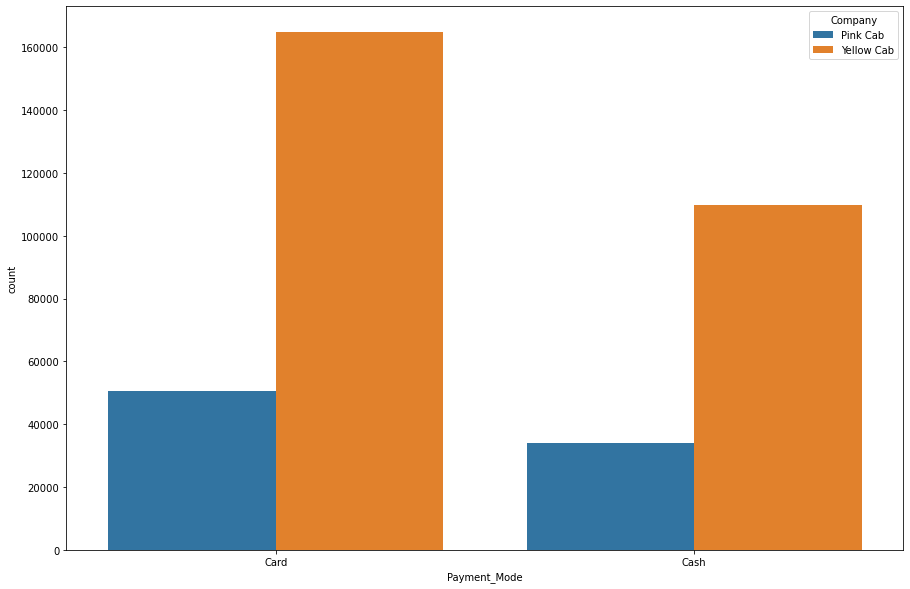

In [56]:
sns.countplot(data=df, x='Payment_Mode', hue='Company')

> Card is the most common mode of payment for both companies

**Price charged per company**

C:\Users\Rocelle Nathalie Ong\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



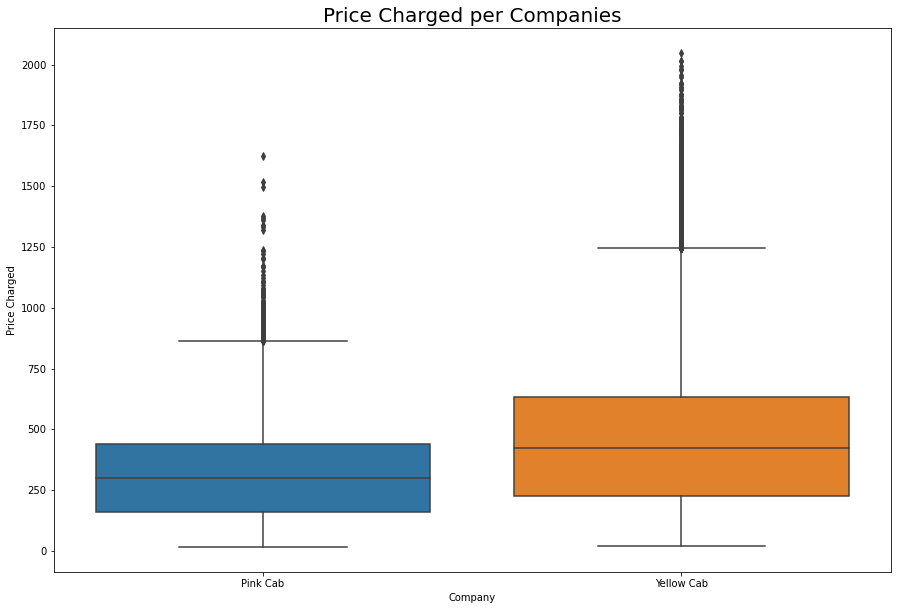

In [55]:
sns.boxplot(df['Company'], df['Price Charged'])
plt.title('Price Charged per Companies', fontsize=20)
plt.show()

> Outliers are present in the price charged column.
> Yellow Cab has higher price charged as compared to Pink cab

**Price charged per distance travelled**

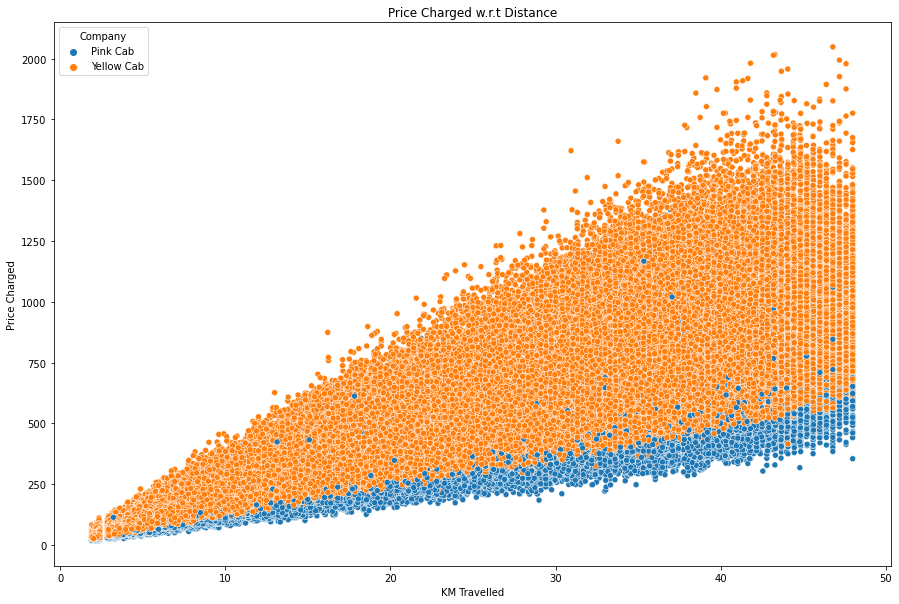

In [62]:
sns.scatterplot(data=df, x="KM Travelled", y='Price Charged', hue='Company')
plt.ylabel('Price Charged')
plt.xlabel('KM Travelled')
plt.title('Price Charged w.r.t Distance')
plt.show()

> KM Travelled and Price Charged has a linear relationship with one another. However, Pink Cab has lesser price charges as compared to Yellow Cab.

**Profit Margin per company**

In [136]:
company = df.groupby('Company')
price_charged = company['Price Charged'].mean()
cost_trip = company['Cost of Trip'].mean()
cost_index = cost_trip.index
cost_trip_values = cost_trip.values
price_charged_values = price_charged.values

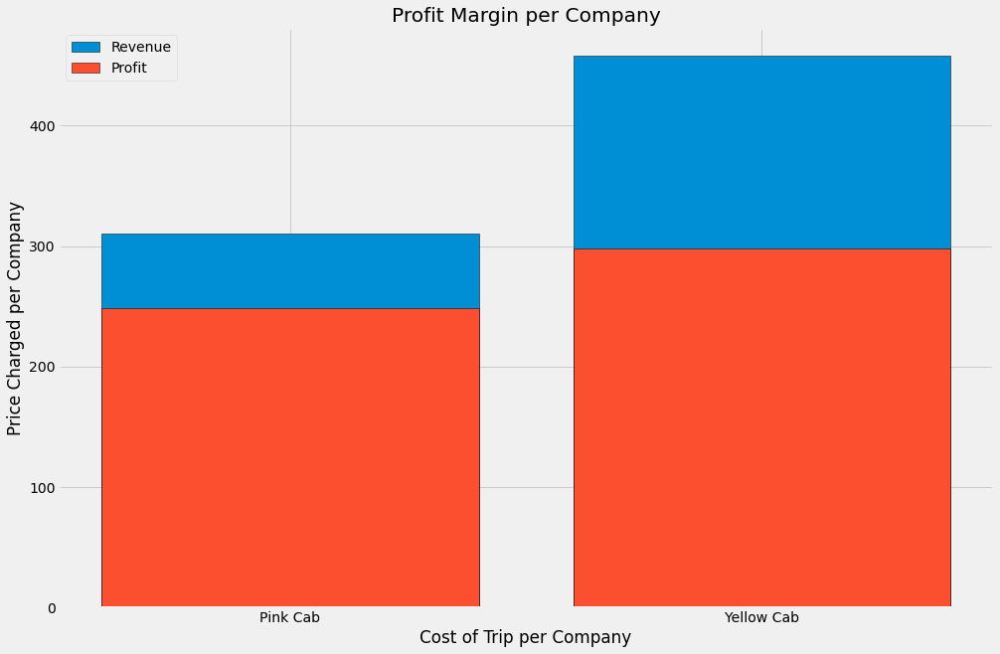

In [139]:
plt.bar(cost_index, price_charged_values, edgecolor='black', label="Revenue")
plt.bar(cost_index, cost_trip_values, edgecolor='black', label="Profit")
plt.title('Profit Margin per Company')
plt.ylabel('Price Charged per Company')
plt.xlabel('Cost of Trip per Company')
plt.legend()
plt.show()

> The Yellow cab has a higher Profit and Revenue compared to Pink cab.

### Hypothesis Test

**Hypothesis 1**: Is there any difference in Profit in terms of Age <br>
H0 : There is no difference regarding Age in both cab companies. <br>
H1 : There is difference regarding Age in both cab companies.

**Pink Cab**

In [141]:
df['Profit'] = df['Price Charged'] - df['Cost of Trip']

In [142]:
lower = df[(df.Age <= 60)&(df.Company=='Pink Cab')].groupby('Transaction ID').Profit.mean()
upper = df[(df.Age >= 60)&(df.Company=='Pink Cab')].groupby('Transaction ID').Profit.mean()

In [159]:
_, p_value = stats.ttest_ind(lower.values,upper.values,equal_var=True)
print(f'The P value: {p_value}')
if(p_value<0.05):
    print('Hypothesis: There is a difference regarding age for Pink Cab, thus accepting the alternative hypothesis (H1)')
else:
    print('Hypothesis: There is no difference regarding age for Pink Cab, thus accepting the null hypothesis (H0)')

The P value: 6.328485471267631e-05
Hypothesis: There is a difference regarding age for Pink Cab, thus accepting the alternative hypothesis (H1)


**Yellow Cab**

In [150]:
lower = df[(df.Age <= 60)&(df.Company=='Yellow Cab')].groupby('Transaction ID').Profit.mean()
upper = df[(df.Age >= 60)&(df.Company=='Yellow Cab')].groupby('Transaction ID').Profit.mean()

In [158]:
_, p_value = stats.ttest_ind(lower.values,upper.values,equal_var=True)
print(f'The P value: {p_value}')
if(p_value<0.05):
    print('Hypothesis: There is a difference regarding age for Yellow Cab, thus accepting the alternative hypothesis (H1)')
else:
    print('Hypothesis: There is no difference regarding age for Yellow Cab, thus accepting the null hypothesis (H0)')

The P value: 6.328485471267631e-05
Hypothesis: There is a difference regarding age for Yellow Cab, thus accepting the alternative hypothesis (H1)


**Hypothesis 2**: Is there any difference in Profit in terms of Payment mode <br>
H0 : There is no difference regarding Payment Mode in both cab companies. <br>
H1 : There is difference regarding Payment Mode in both cab companies. 

**Pink Cab**

In [160]:
card = df[(df.Payment_Mode == 'Card')&(df.Company=='Pink Cab')].groupby('Transaction ID').Profit.mean()
cash = df[(df.Payment_Mode == 'Cash')&(df.Company=='Pink Cab')].groupby('Transaction ID').Profit.mean()

In [161]:
_, p_value = stats.ttest_ind(card.values,cash.values,equal_var=True)
print(f'The P value: {p_value}')
if(p_value<0.05):
    print('Hypothesis: There is a difference regarding Payment Mode for Pink Cab, thus accepting the alternative hypothesis (H1)')
else:
    print('Hypothesis: There is no difference regarding Payment Mode for Pink Cab, thus accepting the null hypothesis (H0)')

The P value: 0.7900465828793288
Hypothesis: There is no difference regarding Payment Mode for Pink Cab, thus accepting the null hypothesis (H0)


**Yellow Cab**

In [162]:
card = df[(df.Payment_Mode == 'Card')&(df.Company=='Yellow Cab')].groupby('Transaction ID').Profit.mean()
cash = df[(df.Payment_Mode == 'Cash')&(df.Company=='Yellow Cab')].groupby('Transaction ID').Profit.mean()

In [163]:
_, p_value = stats.ttest_ind(card.values,cash.values,equal_var=True)
print(f'The P value: {p_value}')
if(p_value<0.05):
    print('Hypothesis: There is a difference regarding Payment Mode for Yellow Cab, thus accepting the alternative hypothesis (H1)')
else:
    print('Hypothesis: There is no difference regarding Payment Mode for Yellow Cab, thus accepting the null hypothesis (H0)')

The P value: 0.2933060638298729
Hypothesis: There is no difference regarding Payment Mode for Yellow Cab, thus accepting the null hypothesis (H0)
